In [1]:
import numpy as np
import os
import tensorflow as tf
from tensorflow import keras
import PIL
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')

import pathlib


In [2]:
allImagesDir = pathlib.Path("TF_pics/")  
caps = list(allImagesDir.glob('cap/*'))

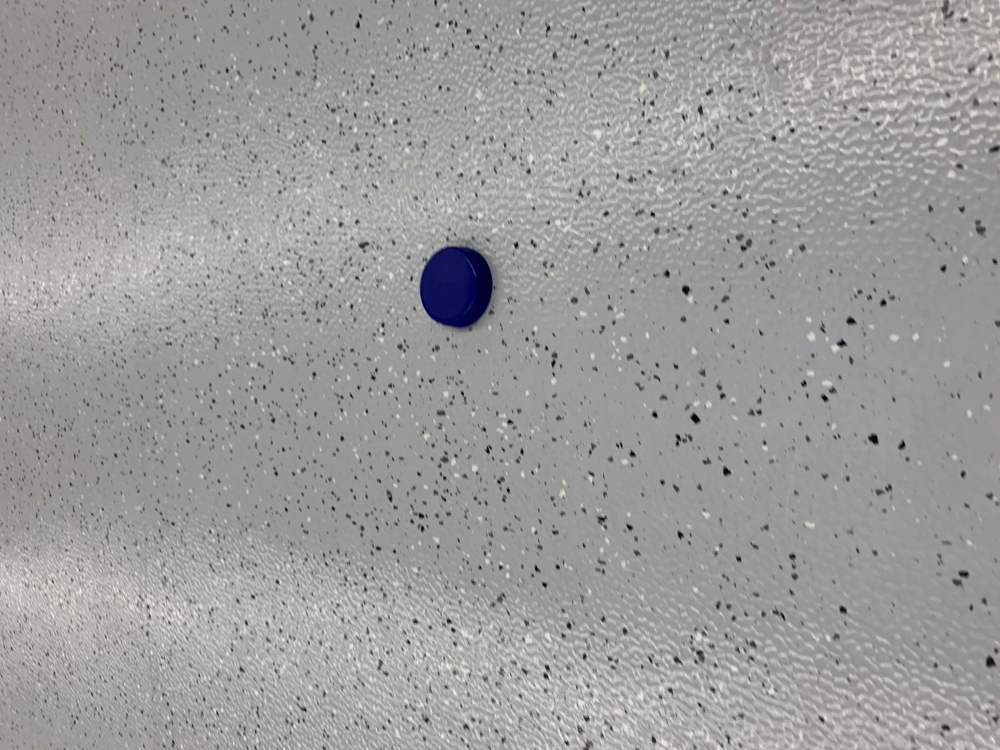

In [3]:
PIL.Image.open(str(caps[0]))

In [3]:
# experiment to see different resolution performance
img_height = 300
img_width = 300
batch_size = 32

In [4]:
X_train = tf.keras.utils.image_dataset_from_directory(
    allImagesDir,
    validation_split=0.2,
    subset="training",
    seed=99,
    image_size=(img_height, img_width),
    batch_size=batch_size 
)

Found 575 files belonging to 3 classes.
Using 460 files for training.


2023-10-11 18:01:28.285258: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-11 18:01:29.019861: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 78911 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:4e:00.0, compute capability: 8.0


In [5]:
X_test = tf.keras.utils.image_dataset_from_directory(
    allImagesDir,
    validation_split=0.2,
    subset="validation",
    seed=99,
    image_size=(img_height, img_width),
    batch_size=batch_size 
)

Found 575 files belonging to 3 classes.
Using 115 files for validation.


In [7]:
""" The data type of X_train"""
X_train

<BatchDataset shapes: ((None, 300, 300, 3), (None,)), types: (tf.float32, tf.int32)>

In [8]:
"""How to get a sample batch"""
it = iter(X_train)
exampleBatch = next(it)[0].numpy()
exampleBatch.shape

2023-10-11 18:02:03.275285: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 111 of 256
2023-10-11 18:02:12.829245: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 242 of 256
2023-10-11 18:02:14.306989: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


(32, 300, 300, 3)

In [9]:
class_names = X_train.class_names
print(class_names)

['cap', 'empty', 'lighter']


In [10]:
for image_batch, labels_batch in X_train:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 300, 300, 3)
(32,)


(-0.5, 299.5, 299.5, -0.5)

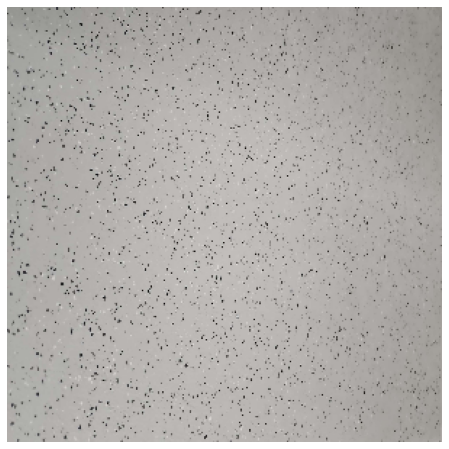

In [11]:
single = exampleBatch[6]
n_single = single.reshape(1,300,300,3)
plt.figure(figsize=(8, 8))
plt.imshow(single.astype("uint8"))
plt.axis("off")

In [10]:
data_augmentation = keras.Sequential(
  [
    keras.layers.RandomRotation(factor=0.15),
    keras.layers.RandomFlip("horizontal_and_vertical",
                      input_shape=(img_height,img_width,3)),
    keras.layers.RandomZoom(height_factor=0.1),
    keras.layers.RandomContrast((0.3,0.1))
    
  ]
)

(-0.5, 299.5, 299.5, -0.5)

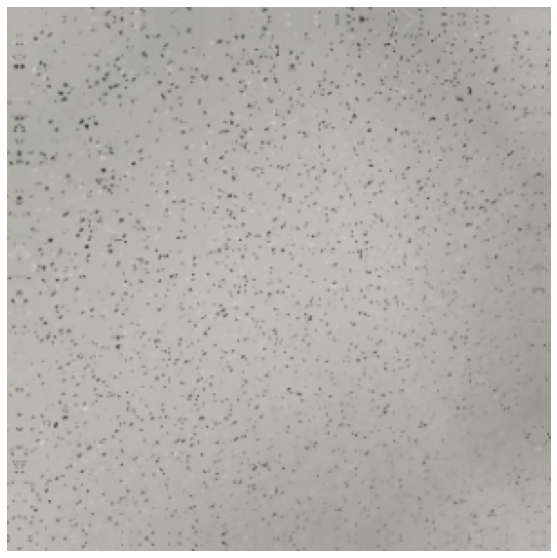

In [13]:
plt.figure(figsize=(10, 10))

augmented_images = data_augmentation(n_single)
plt.imshow(augmented_images[0].numpy().astype("uint8"))
plt.axis("off")
#plt.minorticks_off

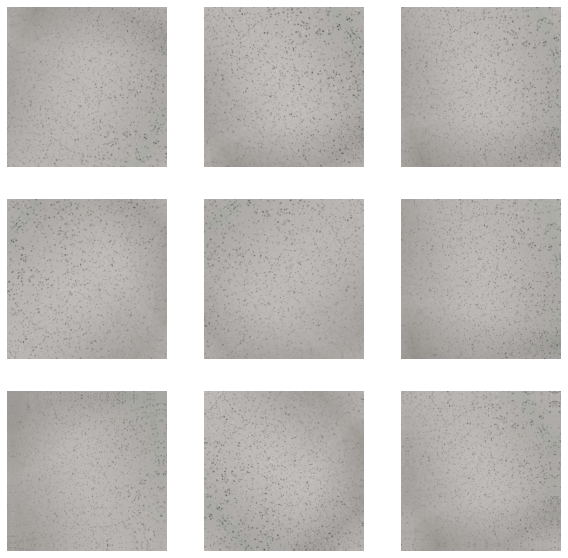

In [14]:
plt.figure(figsize=(10, 10))
for i in range(9):
    augmented_images = data_augmentation(n_single)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

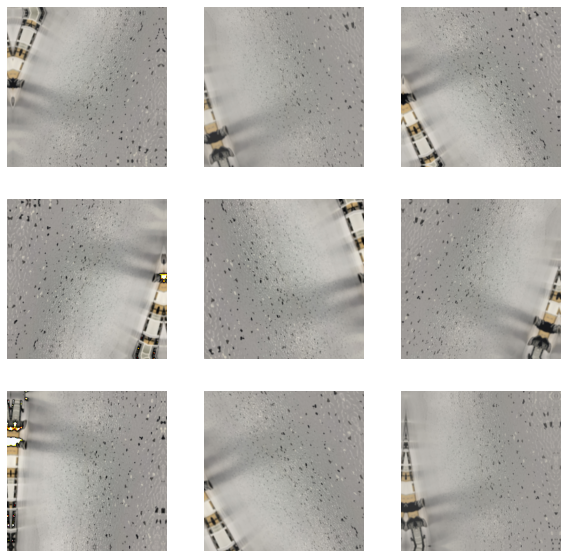

In [15]:
plt.figure(figsize=(10, 10))
for images, _ in X_train.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [11]:
"""Constructing Classification CNN/MLP Model """
model = keras.models.Sequential([
    data_augmentation,
    keras.layers.Rescaling(1./255, input_shape=[300, 300, 3]),
    #keras.layers.Conv2D(4, 7, activation='relu', padding='same' , input_shape=[300, 300, 3]), 
    keras.layers.Conv2D(4, 7, activation='relu', padding='same'), 
    keras.layers.MaxPooling2D(2), # experiment to maybe remove
    keras.layers.Conv2D(8, 8, activation='relu', padding='same'), 
    keras.layers.MaxPooling2D(2), 
    keras.layers.Flatten(), # Why do a flatten here? Need to flatne back to 1-D MLP layer?
    # starting MLP layer
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(3, activation='softmax')  #3 classes, get rid of softmax?( output function maybe want 0,1,2?)
])

In [12]:
"""Compiling Classifier """
model.compile(loss=keras.losses.sparse_categorical_crossentropy,   #MSE or MAE for regression task?
             optimizer=keras.optimizers.Adam(learning_rate=0.001),
             metrics=['accuracy'])

In [13]:
epochs = 70
history = model.fit(X_train, validation_data=X_test, epochs=epochs, batch_size=32) 

Epoch 1/70


2023-10-11 18:02:40.814277: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 251 of 256
2023-10-11 18:02:40.828533: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.
2023-10-11 18:02:42.887998: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2023-10-11 18:02:44.611591: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


15/15 [==============================] - ETA: 0s - loss: 3.2839 - accuracy: 0.3826

2023-10-11 18:03:09.908972: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 86 of 256


15/15 [==============================] - 41s 2s/step - loss: 3.2839 - accuracy: 0.3826 - val_loss: 1.0366 - val_accuracy: 0.4870


2023-10-11 18:03:11.159524: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


Epoch 2/70


2023-10-11 18:03:21.560393: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 251 of 256
2023-10-11 18:03:21.574012: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 24s 904ms/step - loss: 1.0743 - accuracy: 0.4783 - val_loss: 1.0486 - val_accuracy: 0.4870
Epoch 3/70


2023-10-11 18:03:44.878732: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 219 of 256
2023-10-11 18:03:46.504104: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 26s 930ms/step - loss: 1.0601 - accuracy: 0.4783 - val_loss: 1.0622 - val_accuracy: 0.4870
Epoch 4/70


2023-10-11 18:04:26.417713: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 204 of 256
2023-10-11 18:04:27.857051: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 23s 741ms/step - loss: 1.0596 - accuracy: 0.4783 - val_loss: 1.0436 - val_accuracy: 0.4870
Epoch 5/70


2023-10-11 18:04:49.262046: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 232 of 256
2023-10-11 18:04:50.382207: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 24s 682ms/step - loss: 1.0512 - accuracy: 0.4783 - val_loss: 1.0414 - val_accuracy: 0.4870
Epoch 6/70
15/15 [==============================] - 19s 644ms/step - loss: 1.0407 - accuracy: 0.4826 - val_loss: 1.0415 - val_accuracy: 0.4435
Epoch 7/70
15/15 [==============================] - 24s 860ms/step - loss: 1.0396 - accuracy: 0.4761 - val_loss: 1.0510 - val_accuracy: 0.4783
Epoch 8/70
15/15 [==============================] - 23s 885ms/step - loss: 1.0308 - accuracy: 0.4804 - val_loss: 1.0839 - val_accuracy: 0.3739
Epoch 9/70


2023-10-11 18:06:19.394602: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 204 of 256
2023-10-11 18:06:21.290397: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 24s 737ms/step - loss: 1.0206 - accuracy: 0.5043 - val_loss: 1.1128 - val_accuracy: 0.4522
Epoch 10/70
15/15 [==============================] - 19s 752ms/step - loss: 1.0020 - accuracy: 0.5174 - val_loss: 1.4317 - val_accuracy: 0.4000
Epoch 11/70
15/15 [==============================] - 20s 653ms/step - loss: 0.9931 - accuracy: 0.5435 - val_loss: 1.0606 - val_accuracy: 0.5043
Epoch 12/70


2023-10-11 18:07:22.071005: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 237 of 256
2023-10-11 18:07:22.740908: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 25s 903ms/step - loss: 0.9866 - accuracy: 0.5413 - val_loss: 1.1251 - val_accuracy: 0.5130
Epoch 13/70
15/15 [==============================] - 19s 588ms/step - loss: 1.0084 - accuracy: 0.5348 - val_loss: 1.3442 - val_accuracy: 0.5130
Epoch 14/70
15/15 [==============================] - 20s 701ms/step - loss: 0.9926 - accuracy: 0.5500 - val_loss: 0.9593 - val_accuracy: 0.5652
Epoch 15/70
15/15 [==============================] - 24s 904ms/step - loss: 1.0057 - accuracy: 0.5457 - val_loss: 0.9768 - val_accuracy: 0.5565
Epoch 16/70
15/15 [==============================] - 22s 795ms/step - loss: 0.9839 - accuracy: 0.5348 - val_loss: 1.0485 - val_accuracy: 0.5304
Epoch 17/70


2023-10-11 18:09:11.768020: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 191 of 256
2023-10-11 18:09:12.995310: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 21s 643ms/step - loss: 0.9708 - accuracy: 0.5587 - val_loss: 1.0293 - val_accuracy: 0.5652
Epoch 18/70


2023-10-11 18:09:32.582697: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 249 of 256
2023-10-11 18:09:32.587579: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 21s 714ms/step - loss: 0.9527 - accuracy: 0.5717 - val_loss: 1.1337 - val_accuracy: 0.5652
Epoch 19/70


2023-10-11 18:09:53.526752: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 216 of 256
2023-10-11 18:09:54.230923: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 23s 823ms/step - loss: 0.9475 - accuracy: 0.5630 - val_loss: 1.3817 - val_accuracy: 0.4609
Epoch 20/70


2023-10-11 18:10:17.113547: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 225 of 256
2023-10-11 18:10:17.669485: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 20s 600ms/step - loss: 0.9391 - accuracy: 0.5674 - val_loss: 1.1115 - val_accuracy: 0.5565
Epoch 21/70
15/15 [==============================] - 22s 995ms/step - loss: 0.9538 - accuracy: 0.5609 - val_loss: 1.5877 - val_accuracy: 0.4609
Epoch 22/70
15/15 [==============================] - 22s 704ms/step - loss: 0.9584 - accuracy: 0.5457 - val_loss: 1.2545 - val_accuracy: 0.5043
Epoch 23/70
15/15 [==============================] - 19s 735ms/step - loss: 0.9406 - accuracy: 0.5696 - val_loss: 1.0346 - val_accuracy: 0.5217
Epoch 24/70


2023-10-11 18:11:41.278296: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 246 of 256
2023-10-11 18:11:41.429127: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 24s 928ms/step - loss: 0.9458 - accuracy: 0.5500 - val_loss: 1.4540 - val_accuracy: 0.4870
Epoch 25/70
15/15 [==============================] - 25s 962ms/step - loss: 0.9221 - accuracy: 0.5870 - val_loss: 1.4777 - val_accuracy: 0.5217
Epoch 26/70
15/15 [==============================] - 21s 835ms/step - loss: 0.9083 - accuracy: 0.5739 - val_loss: 0.9839 - val_accuracy: 0.5913
Epoch 27/70


2023-10-11 18:12:51.314692: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 239 of 256
2023-10-11 18:12:51.828316: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 24s 824ms/step - loss: 0.9115 - accuracy: 0.5783 - val_loss: 1.1686 - val_accuracy: 0.5304
Epoch 28/70
15/15 [==============================] - 20s 669ms/step - loss: 0.9150 - accuracy: 0.5522 - val_loss: 1.5143 - val_accuracy: 0.4174
Epoch 29/70
15/15 [==============================] - 18s 686ms/step - loss: 0.8795 - accuracy: 0.6043 - val_loss: 1.6037 - val_accuracy: 0.4348
Epoch 30/70
15/15 [==============================] - 19s 698ms/step - loss: 0.8960 - accuracy: 0.5652 - val_loss: 1.1024 - val_accuracy: 0.5391
Epoch 31/70
15/15 [==============================] - 19s 709ms/step - loss: 0.9139 - accuracy: 0.5761 - val_loss: 1.6572 - val_accuracy: 0.3739
Epoch 32/70
15/15 [==============================] - 19s 798ms/step - loss: 0.8968 - accuracy: 0.5804 - val_loss: 1.2947 - val_accuracy: 0.5304
Epoch 33/70
15/15 [==============================] - 20s 611ms/step - loss: 0.9009 - accuracy: 0.5913 - val_loss: 1.1181 - val_accuracy: 0.5478
Epoc

2023-10-11 18:15:09.396730: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 224 of 256
2023-10-11 18:15:10.444209: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 23s 694ms/step - loss: 0.8672 - accuracy: 0.6022 - val_loss: 0.8630 - val_accuracy: 0.6000
Epoch 35/70


2023-10-11 18:15:32.199885: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:380] Filling up shuffle buffer (this may take a while): 220 of 256
2023-10-11 18:15:33.841572: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:405] Shuffle buffer filled.


15/15 [==============================] - 25s 889ms/step - loss: 0.8668 - accuracy: 0.5761 - val_loss: 4.3152 - val_accuracy: 0.2435
Epoch 36/70
15/15 [==============================] - 23s 910ms/step - loss: 0.9026 - accuracy: 0.5891 - val_loss: 1.3320 - val_accuracy: 0.4435
Epoch 37/70
15/15 [==============================] - 20s 771ms/step - loss: 0.8414 - accuracy: 0.6087 - val_loss: 1.0301 - val_accuracy: 0.5478
Epoch 38/70
15/15 [==============================] - 18s 669ms/step - loss: 0.8475 - accuracy: 0.5739 - val_loss: 0.8732 - val_accuracy: 0.5826
Epoch 39/70
15/15 [==============================] - 23s 997ms/step - loss: 0.9138 - accuracy: 0.5870 - val_loss: 0.8194 - val_accuracy: 0.5739
Epoch 40/70
15/15 [==============================] - 23s 910ms/step - loss: 0.9151 - accuracy: 0.5630 - val_loss: 1.7088 - val_accuracy: 0.4696
Epoch 41/70
15/15 [==============================] - 23s 926ms/step - loss: 0.8993 - accuracy: 0.5652 - val_loss: 0.8494 - val_accuracy: 0.6261
Epoc

In [33]:
"""Storing Model in Keras format"""
model.save('Aug_MLP_CNN2.keras')

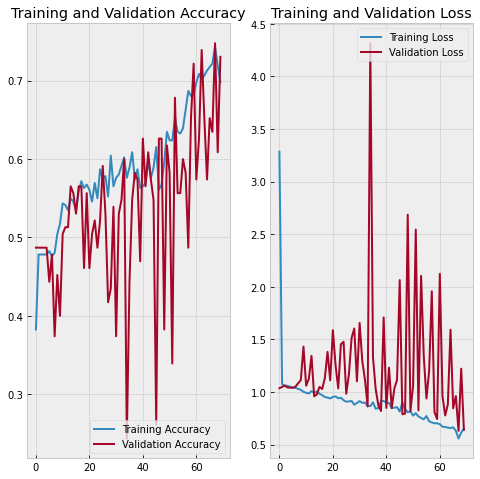

In [14]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()